In [2]:
import json
import numpy as np


In [4]:
labelFile = open("data_treesatai/labels/TreeSatBA_v9_60m_multi_labels.json")
labels = json.load(labelFile)
#img_id = "Abies_alba_0_2545_WEFL_NLF" 
img_id = "Prunus_spec._0_70697_WEFL_NLF"
image_name = f"{img_id}.tif"
print(json.dumps(labels,indent=1))


{
 "Pseudotsuga_menziesii_3_78528_WEFL_NLF.tif": [
  [
   "Pseudotsuga",
   1.0
  ]
 ],
 "Abies_alba_3_834_WEFL_NLF.tif": [
  [
   "Abies",
   0.93771
  ],
  [
   "Larix",
   0.06229
  ]
 ],
 "Acer_pseudoplatanus_1_7587_WEFL_NLF.tif": [
  [
   "Acer",
   0.93266
  ],
  [
   "Picea",
   0.06734
  ]
 ],
 "Betula_spec._3_16038_WEFL_NLF.tif": [
  [
   "Betula",
   0.94366
  ]
 ],
 "Cleared_0_23454_WEFL_NLF.tif": [
  [
   "Cleared",
   1.0
  ]
 ],
 "Fagus_sylvatica_7_27697_WEFL_NLF.tif": [
  [
   "Fagus",
   0.94659
  ],
  [
   "Picea",
   0.05341
  ]
 ],
 "Pseudotsuga_menziesii_0_76151_WEFL_NLF.tif": [
  [
   "Pseudotsuga",
   0.38587
  ],
  [
   "Picea",
   0.34596
  ],
  [
   "Quercus",
   0.26817
  ]
 ],
 "Acer_pseudoplatanus_2_6186_WEFL_NLF.tif": [
  [
   "Acer",
   0.98279
  ],
  [
   "Fagus",
   0.01721
  ]
 ],
 "Fraxinus_excelsior_3_32881_WEFL_NLF.tif": [
  [
   "Fraxinus",
   0.87873
  ],
  [
   "Picea",
   0.06498
  ],
  [
   "Fagus",
   0.01225
  ]
 ],
 "Fagus_sylvatica_1_29861_W

In [5]:
print(labels[image_name])
print(len(np.unique(list(labels.keys())))) # 50381 images triplets (areal s1 s2) )


[['Prunus', 0.83457], ['Cleared', 0.14394], ['Quercus', 0.02014]]
50380


In [24]:
from PIL import Image

#rep_aer = "data_treesatai/aerial/aerial_60m_abies_alba/"
rep_s1 = "data_treesatai/s1/60m/"
rep_s2 = "data_treesatai/s2/60m/"
rep_aer = "data_treesatai/aerial/aerial_60m_prunus_spec/"
#rep_s1 = "data_treesatai/s1/20m/"
#rep_s2 = "data_treesatai/s2/200m/"

im = Image.open(f'{rep_aer}{image_name}')
im.show()


4
304 304
BoundingBox(left=550445.8, bottom=5726452.800000001, right=550506.6, top=5726513.600000001)
(<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>, <ColorInterp.alpha: 6>)
(<ColorInterp.gray: 1>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>)
(<ColorInterp.gray: 1>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>, <ColorInterp.undefined: 0>)
(304, 304)
(4, 304, 304)
1 uint8 None
2 uint8 None
3 uint8 None
4 uint8 None


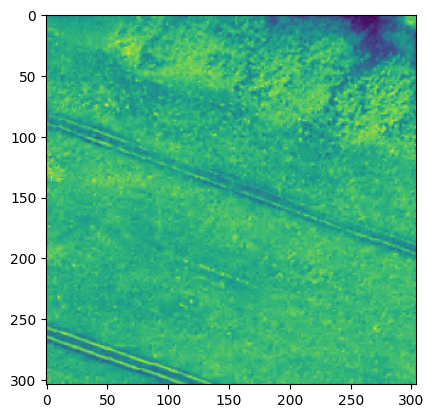

In [25]:
import rasterio
from rasterio.transform import rowcol,xy  # For geo-to-pixel conversion
from matplotlib import pyplot as plt

#aerial 4 bands R G B alpha 304*304 pixels
#s1 3 bands 
#s2 12 bands

src_aer = rasterio.open(f"{rep_aer}{image_name}")
src_s1 = rasterio.open(f"{rep_s1}{image_name}")
src_s2 = rasterio.open(f"{rep_s2}{image_name}")

print(src_aer.count) #number of bands
print(src_aer.width,src_aer.height) #image pixel size
print(src_aer.bounds)

print(src_aer.colorinterp)
print(src_s1.colorinterp)
print(src_s2.colorinterp)

#reading only one band
array1 = src_aer.read(1)
print(array1.shape) # image size

#reading all bands at once
array4d = src_aer.read()
print(array4d.shape)

for i, dtype, nodataval in zip(src_aer.indexes, src_aer.dtypes, src_aer.nodatavals):
    print(i, dtype, nodataval)


plt.imshow(src_aer.read(1)) #shows the first band (first band index starts at 1)
plt.show()





In [26]:
print(src_aer.bounds)
print(src_aer.transform)
print(src_aer.transform * (0, 0)) #top left
print(src_aer.transform * (src_aer.width, src_aer.height)) #down right 
print(src_aer.crs)
height,width = src_aer.height,src_aer.width 
print(height,width)
print(array1[height// 2, width // 2]) #value of the middle of the band 1
spatialcoord = src_aer.xy(src_aer.height // 2, src_aer.width // 2) 
print(spatialcoord) # spatial coord of the pixel in the middle 
row, col = rowcol(src_aer.transform, xs=spatialcoord[0], ys=spatialcoord[1]) #xs not ints stay float or else losing 
print(row,col)
spatialcoord = src_aer.xy(row,col)
print(spatialcoord)


BoundingBox(left=550445.8, bottom=5726452.800000001, right=550506.6, top=5726513.600000001)
| 0.20, 0.00, 550445.80|
| 0.00,-0.20, 5726513.60|
| 0.00, 0.00, 1.00|
(550445.8, 5726513.600000001)
(550506.6, 5726452.800000001)
EPSG:25832
304 304
156
(np.float64(550476.3), np.float64(5726483.100000001))
152 152
(np.float64(550476.3), np.float64(5726483.100000001))


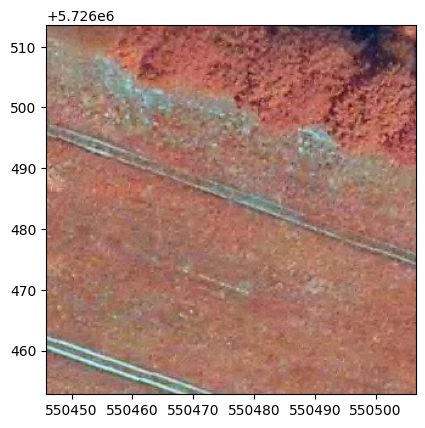

<Axes: >

In [27]:
from rasterio.plot import show
#show(src_aer) #all at once
show(src_aer.read(), transform=src_aer.transform)


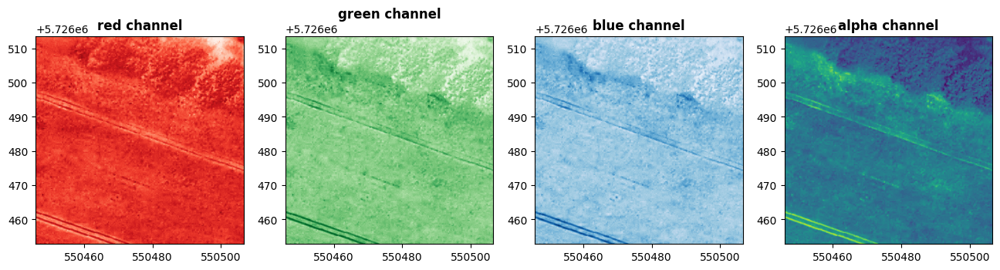

In [28]:
fig, (axr, axg, axb,axa) = plt.subplots(1,4, figsize=(16,7))
show((src_aer, 1), ax=axr, cmap='Reds', title='red channel')
show((src_aer, 2), ax=axg, cmap='Greens', title='green channel')
show((src_aer, 3), ax=axb, cmap='Blues', title='blue channel')
show((src_aer, 4), ax=axa, title='alpha channel')
plt.show()


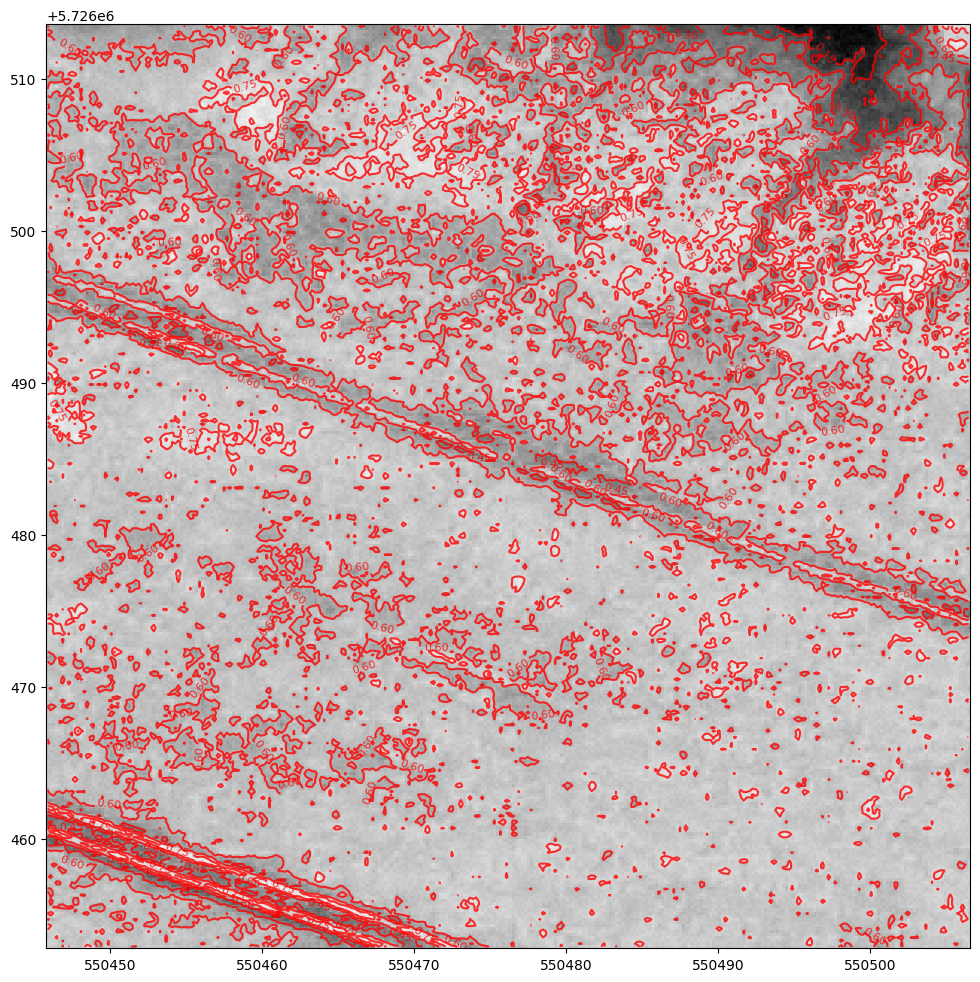

In [29]:
fig, ax = plt.subplots(1, figsize=(12, 12))
show((src_aer, 1), cmap='Greys_r', interpolation='none', ax=ax)
show((src_aer, 1), contour=True, ax=ax)
plt.show()


In [30]:
import json
from rasterio.transform import rowcol,xy  # For geo-to-pixel conversion
import matplotlib.patches as mpatches   # For drawing shapes
from shapely.geometry import shape      

In [31]:
#bb60geoFile = open("data_treesatai/geojson/bb_60m.GeoJSON")
#bb60geo = json.load(bb60geoFile)

with open("data_treesatai/geojson/bb_60m.GeoJSON") as f:
    bb60geo = json.load(f)

#print(json.dumps(bb60geo,indent=2))


In [33]:
print(f"Image CRS: {src_aer.crs}")
print(f"GeoJSON CRS: EPSG:25832")  # From your GeoJSON crs field

Image CRS: EPSG:25832
GeoJSON CRS: EPSG:25832


In [34]:
features = bb60geo['features']
#feature = features["property"]["IMG_ID"]
feature = [x for x in features if x['properties']['IMG_ID'] == f"{img_id}"][0]
print(json.dumps(feature,indent=2))


{
  "type": "Feature",
  "id": 40377,
  "properties": {
    "IMG_ID": "Prunus_spec._0_70697_WEFL_NLF",
    "ID": "70697",
    "BT_DEU": "Kir",
    "BT_ENG": "Cherry",
    "BT_BOT": "Prunus spec.",
    "BT_GEN": "Prunus",
    "AKL": "0",
    "SOURCE": "WEFL_NLF",
    "l0": "forest",
    "l1": "broadleaf",
    "l2": "long-lived deciduous",
    "l3": "cherry",
    "YEAR": "2013",
    "SPLIT": "train"
  },
  "geometry": {
    "type": "Polygon",
    "coordinates": [
      [
        [
          550506.523512,
          5726513.53890485
        ],
        [
          550506.523512,
          5726452.73890485
        ],
        [
          550445.723512,
          5726452.73890485
        ],
        [
          550445.723512,
          5726513.53890485
        ],
        [
          550506.523512,
          5726513.53890485
        ]
      ]
    ]
  }
}


In [35]:
geom = shape(feature['geometry'])  # Convert to shapely Geometry
print(geom)
properties = feature['properties']
#species = properties['BT_GEN']  #Botanical genus name eg 
species = properties["BT_ENG"] #Botanical species name english 
print(species)


POLYGON ((550506.523512 5726513.53890485, 550506.523512 5726452.73890485, 550445.723512 5726452.73890485, 550445.723512 5726513.53890485, 550506.523512 5726513.53890485))
Cherry


(np.float64(-0.5), np.float64(303.5), np.float64(303.5), np.float64(-0.5))

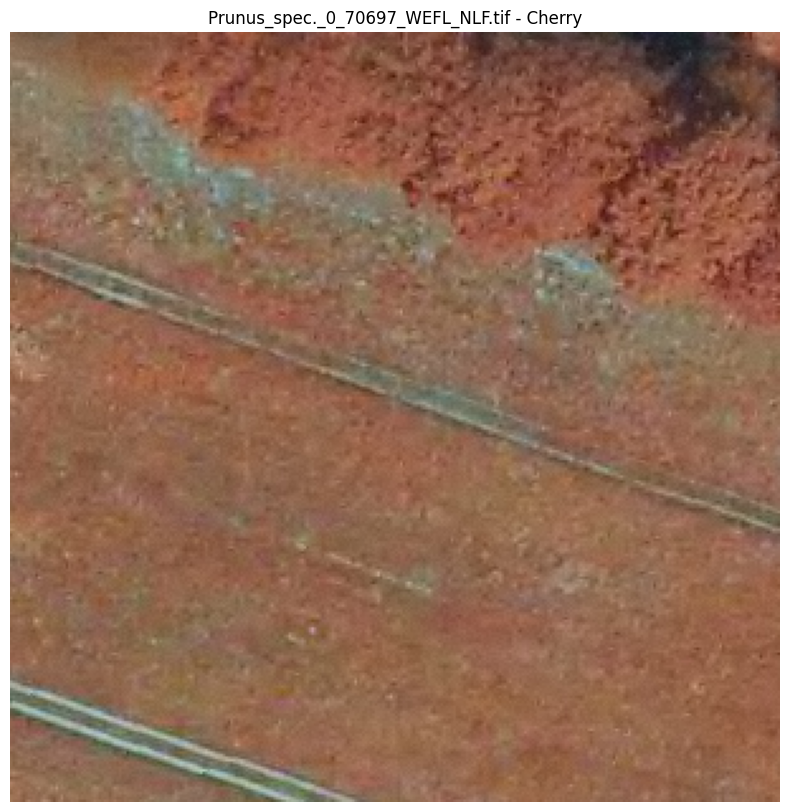

In [36]:

#src_aer = rasterio.open(f"{rep_aer}{image_name}")
rgb = src_aer.read([1,2,3])
#rgb = src_aer.read([1, 2, 3])  # RGB Shape: (3, height, width)
#rgb = np.nan_to_num(rgb)  # Handle nodata properly
#rgb = (rgb / np.nanmax(rgb)) * 255  # Normalize; handle nodata with np.nan_to_num
#rgb = np.clip((rgb / np.nanpercentile(rgb, 99)) * 255, 0, 255).astype(np.uint8).transpose(1, 2, 0)

rgb = rgb.transpose(1, 2, 0)  # To (H, W, 3)

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(rgb)
ax.set_title(f"{image_name} - {species}")
ax.axis('off')


geom type: Polygon and geo coords: [(550506.523512, 5726513.53890485), (550506.523512, 5726452.73890485), (550445.723512, 5726452.73890485), (550445.723512, 5726513.53890485), (550506.523512, 5726513.53890485)]
BoundingBox(left=550445.8, bottom=5726452.800000001, right=550506.6, top=5726513.600000001)
0 303
304 303
304 -1
0 -1
0 303
pixel coords: [(0, 303), (303, 303), (303, 0), (0, 0), (0, 303)]
Image bounds: BoundingBox(left=550445.8, bottom=5726452.800000001, right=550506.6, top=5726513.600000001)
Image pixel bounds: row/col 0-303, 0-303


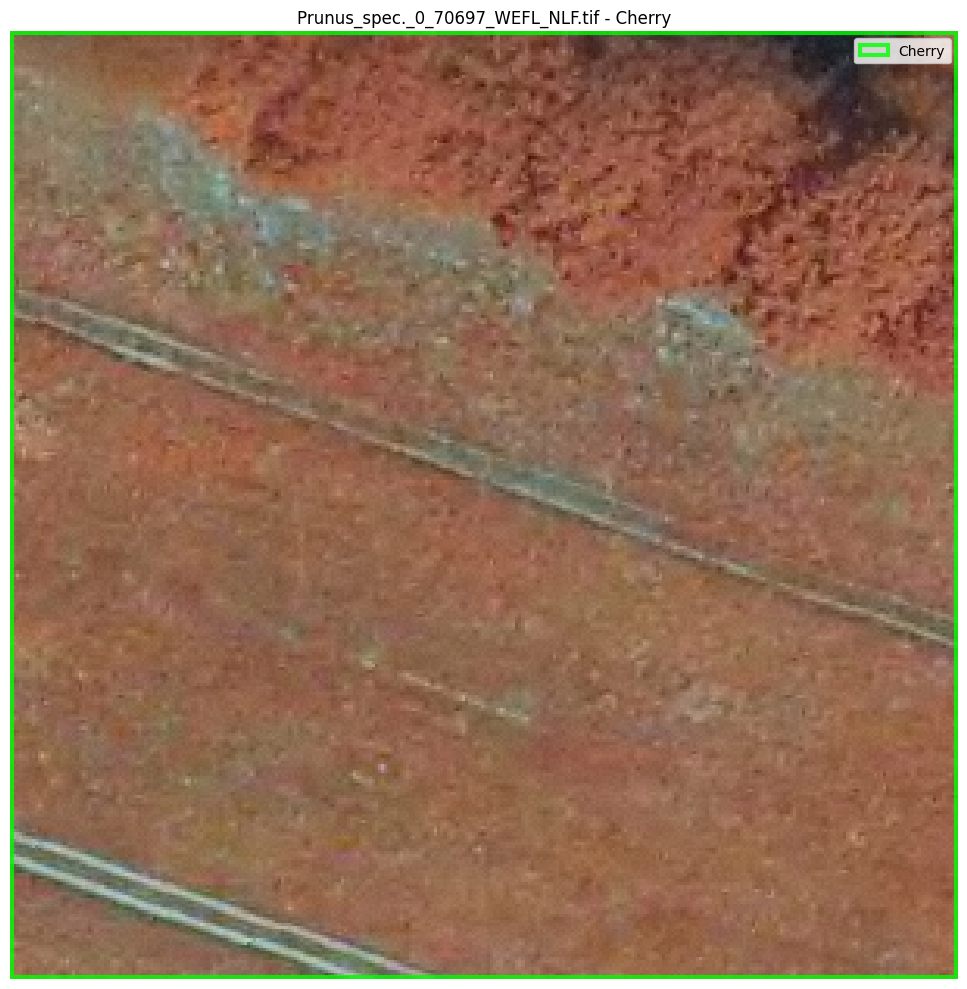

In [ ]:
coords = list(geom.exterior.coords) if geom.geom_type == 'Polygon' else [geom.coords[0]] if geom.geom_type == 'Point' else []
print(f"geom type: {geom.geom_type} and geo coords: {coords}")
print(src_aer.bounds)
height, width = src_aer.height, src_aer.width #304,304

pixel_coords = []
for lon, lat in coords:
    row, col = rowcol(src_aer.transform, xs=lon, ys=lat)
    print(row,col)
    row = max(0, min(height-1, row))
    col = max(0, min(width-1, col))
    pixel_coords.append((row, col))

print(f"pixel coords: {pixel_coords}")


fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(rgb)
ax.set_title(f"{image_name} - {species}")
ax.axis('off')


if geom.geom_type == 'Polygon':
    if pixel_coords[0] != pixel_coords[-1]:
        pixel_coords.append(pixel_coords[0])
    poly = mpatches.Polygon(pixel_coords, linewidth=3, edgecolor='lime', facecolor='none', alpha=0.8, label=species)
    ax.add_patch(poly)

elif geom.geom_type == 'Point':
    ax.plot(pixel_coords[0][1], pixel_coords[0][0], 'ro', markersize=8, label='Point')  # (col, row)



print(f"Image bounds: {src_aer.bounds}")  # Should encompass your geo coords
print(f"Image pixel bounds: row/col 0-{src_aer.height-1}, 0-{src_aer.width-1}")

plt.legend()
plt.tight_layout()
plt.show()




geom type: Polygon and geo coords: [(552306.10708846, 5728214.99416934), (552306.10708846, 5728154.19416934), (552245.30708846,---- 5728154.19416934)----, (552245.30708846, 5728214.99416934), (552306.10708846, 5728214.99416934)]

pixel coords: [(0, 303), (304, 303), (304, -1), (0, -1), (0, 303)]

Image bounds: BoundingBox(left=552245.4, ---bottom=5728154.2---, right=552306.2, top=5728215.0)



In [38]:

mid_geo = xy(src_aer.transform, height//2, width//2)[::-1]  # Should be image center
print(mid_geo)
mid_rowcol = rowcol(src_aer.transform, *mid_geo)
print(f"Image center geo → pixel: {mid_rowcol}")  # Should be ~152,152

(np.float64(5726483.100000001), np.float64(550476.3))
Image center geo → pixel: (np.int32(25880186), np.int32(25880186))


In [122]:
"""
if geom.geom_type == 'Polygon':
    # Close polygon if needed
    if pixel_coords[0] != pixel_coords[-1]:
        pixel_coords.append(pixel_coords[0]) # pour close polygon
    poly = mpatches.Polygon(pixel_coords, linewidth=2, edgecolor='red', facecolor='none', alpha=0.7)
    ax.add_patch(poly)

elif geom.geom_type == 'Point':
    ax.plot(pixel_coords[0][1], pixel_coords[0][0], 'ro', markersize=8, label='Point')  # (col, row)

elif geom.geom_type == 'MultiPoint':
    rows, cols = zip(*pixel_coords)
    ax.scatter(cols, rows, c='green', s=50, marker='^', label='Points')


else:  # Approximate bbox from extent
    min_row, min_col = min(pixel_coords, key=lambda p: p[0])[0], min(pixel_coords, key=lambda p: p[1])[1]
    max_row, max_col = max(pixel_coords, key=lambda p: p[0])[0], max(pixel_coords, key=lambda p: p[1])[1]
    rect = mpatches.Rectangle((min_col, min_row), max_col - min_col, max_row - min_row,
                              linewidth=2, edgecolor='blue', facecolor='none')
    ax.add_patch(rect)

plt.legend()
plt.show()
src_aer.close()
"""

"\nif geom.geom_type == 'Polygon':\n    # Close polygon if needed\n    if pixel_coords[0] != pixel_coords[-1]:\n        pixel_coords.append(pixel_coords[0]) # pour close polygon\n    poly = mpatches.Polygon(pixel_coords, linewidth=2, edgecolor='red', facecolor='none', alpha=0.7)\n    ax.add_patch(poly)\n\nelif geom.geom_type == 'Point':\n    ax.plot(pixel_coords[0][1], pixel_coords[0][0], 'ro', markersize=8, label='Point')  # (col, row)\n\nelif geom.geom_type == 'MultiPoint':\n    rows, cols = zip(*pixel_coords)\n    ax.scatter(cols, rows, c='green', s=50, marker='^', label='Points')\n\n\nelse:  # Approximate bbox from extent\n    min_row, min_col = min(pixel_coords, key=lambda p: p[0])[0], min(pixel_coords, key=lambda p: p[1])[1]\n    max_row, max_col = max(pixel_coords, key=lambda p: p[0])[0], max(pixel_coords, key=lambda p: p[1])[1]\n    rect = mpatches.Rectangle((min_col, min_row), max_col - min_col, max_row - min_row,\n                              linewidth=2, edgecolor='blue', f

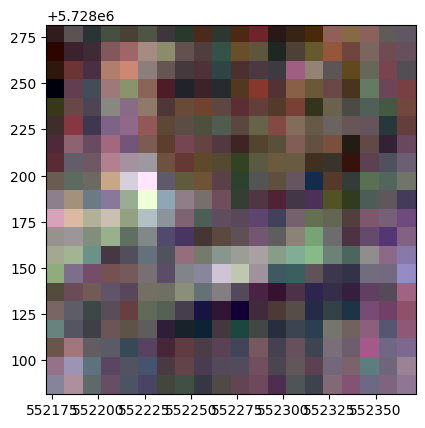

<Axes: >

In [40]:
rep_s1 = "data_treesatai/s1/200m/"
rep_s2 = "data_treesatai/s2/200m/"
img_id = "Abies_alba_0_2545_WEFL_NLF"
image_name = f"{img_id}.tif"

src_s1 = rasterio.open(f"{rep_s1}{image_name}")
src_s2 = rasterio.open(f"{rep_s2}{image_name}")
show(src_s2) #all at once

